# 🐣 Runhouse Basics - Fun with Stable Diffusion and FLAN-T5

Runhouse is nothing more than an accessibility and sharing layer into your own cloud compute and data resources. This tutorial demonstrates how to create, setup, and run remote functions on **your own GPU**, using Stable Diffusion inference as an example.

You can run this on your own cluster, or through a standard cloud account (AWS, GCP, Azure, LambdaLabs). If you do not have any compute or cloud accounts set up, we recommend creating a [LambdaLabs](https://cloud.lambdalabs.com/) account for the easiest setup path.

## Table of Contents
* Hardware Setup
* Stable Diffusion on a Cloud GPU in 5 lines of code
* Faster Stable Diffusion
* FLAN-T5 Stable Diffusion

## Hardware Setup

### Install Runhouse

In [ ]:
!pip install runhouse

In [2]:
import runhouse as rh

INFO | 2023-02-07 15:37:56,202 | Loaded Runhouse config from /root/.rh/config.yaml
INFO | 2023-02-07 15:37:56,965 | NumExpr defaulting to 2 threads.


### [Optional] Login to Runhouse to load in secrets

In [4]:
rh.login(download_secrets=True, download_config=True, interactive=True)

____              __                             @ @ @
           / __ \__  ______  / /_  ____  __  __________     []___
          / /_/ / / / / __ \/ __ \/ __ \/ / / / ___/ _ \   /    /\____    @@
         / _, _/ /_/ / / / / / / / /_/ / /_/ (__  )  __/  /_/\_//____/\  @@@@
        /_/ |_|\__,_/_/ /_/_/ /_/\____/\__,_/____/\___/   | || |||__|||   ||

Retrieve your token 🔑 here to use 🏃 🏠 Runhouse for secrets and artifact management: ]8;id=984876;https://api.run.house/dashboard/?option=token\https://api.run.house]8;;\

Token: ··········
Upload your local config to Runhouse? [y/N]: y
Upload your enabled cloud provider secrets to Vault? [y/N]: y
INFO | 2023-02-07 15:39:28,273 | Getting secrets from Vault.
INFO | 2023-02-07 15:39:29,896 | Found credentials in shared credentials file: ~/.aws/credentials
INFO | 2023-02-07 15:39:30,765 | Saved secrets from Vault to local config files for providers: ['aws', 'sky']
INFO | 2023-02-07 15:39:32,168 | Found credentials in shared credentials file: ~/.aws/credentials
Upload secrets for aws? [y/N]: y
Upload secrets for sky? [y/N]: y
INFO | 2023-02-07 15:39:35,962 | Uploaded secrets for providers ['aws', 'sky'] to Vault
INFO | 2023-02-07 15:39:35,965 | Successfully logged into Runhouse.


### Set up Runhouse cluster

Runhouse leverages SkyPilot for cloud-provider on-demand clusters. If using an on-demand AWS, GCP, Azure, LambdaLabs cluster, run the `sky check` CLI command for instructions on how to set up local credentials for your specified cloud provider(s). You can rerun this command after setup to check that it has been set up correctly.

In [ ]:
!sky check

In [ ]:
# Uncomment if you're using GCP and running inside Colab!
# !gcloud init
# !gcloud auth application-default login
# !cp -r /content/.config/* ~/.config/gcloud

Depending on your cloud provider, uncomment out one of the following options to instantiate your `rh-a10x`, and save it to your rh config.

In [ ]:
# For GCP, Azure, or Lambda Labs
# rh.cluster(name='rh-a10x', instance_type='A100:1').save()

# For AWS (single A100s not available, base A10G may have insufficient CPU RAM)
# rh.cluster(name='rh-a10x', instance_type='g5.2xlarge', provider='aws').save()

# To use our own GPU (or from a different provider, e.g. Paperspace, Coreweave)
# rh.cluster(ips=['<ip of the cluster>'], 
#            ssh_creds={'ssh_user': '...', 'ssh_private_key':'<path_to_key>'},
#            name='rh-a10x').save()

Now we're ready to get started running!

## 01 Stable Diffusion on a Cloud GPU in 5 lines of code
We'll use Runhouse to experiment with Stable Diffusion from your laptop, while the model actually runs on an A100/A10G in the cloud.

In [ ]:
gpu = rh.cluster(name='rh-a10x')

In [16]:
def sd_generate(prompt, num_images=1, steps=100, guidance_scale=7.5, model_id='stabilityai/stable-diffusion-2-base'):
    # imports must be defined inside the function for notebook environments
    from diffusers import StableDiffusionPipeline
    import torch
    
    pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16, revision='fp16').to('cuda')
    return pipe([prompt] * num_images, num_inference_steps=steps, guidance_scale=guidance_scale).images

In [ ]:
generate_gpu = rh.function(fn=sd_generate).to(
    gpu,
    env=['./', 'torch --upgrade --extra-index-url https://download.pytorch.org/whl/cu117', 'diffusers', 'transformers']
)

In [ ]:
# for outputting images later
!pip install ipyplot
import ipyplot

INFO | 2023-02-07 16:10:42,374 | Running sd_generate via gRPC
INFO | 2023-02-07 16:11:27,874 | Time to send message: 45.5 seconds
WARNING | 2023-02-07 16:11:27,885 | /usr/local/lib/python3.8/dist-packages/ipyplot/_utils.py:95: FutureWarning: The input object of type 'Image' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Image', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  return np.asarray(seq, dtype=type(seq[0]))




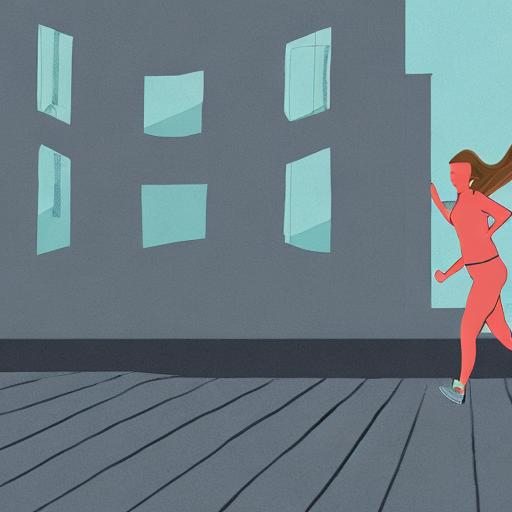
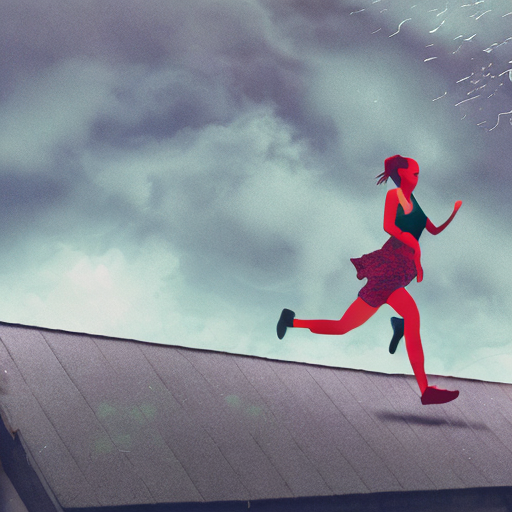
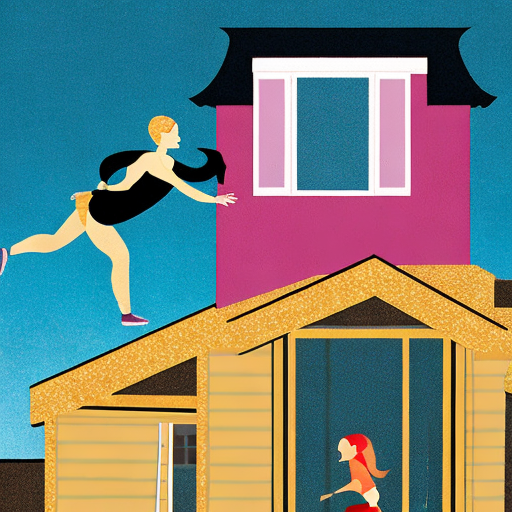
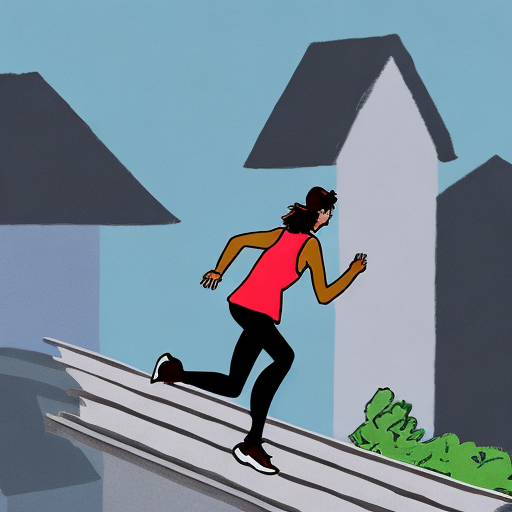


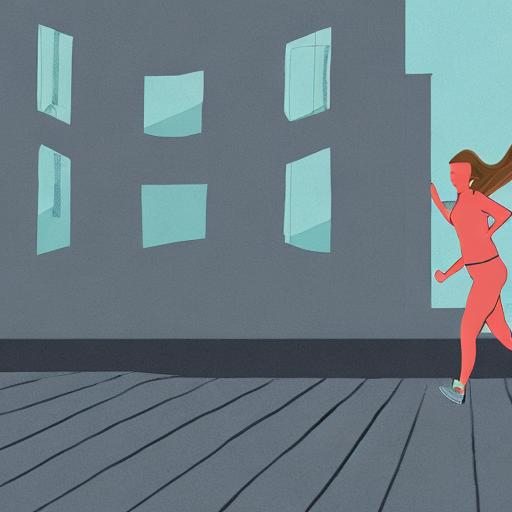
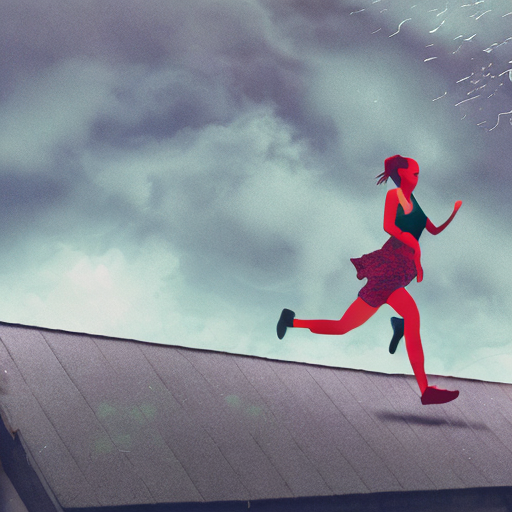
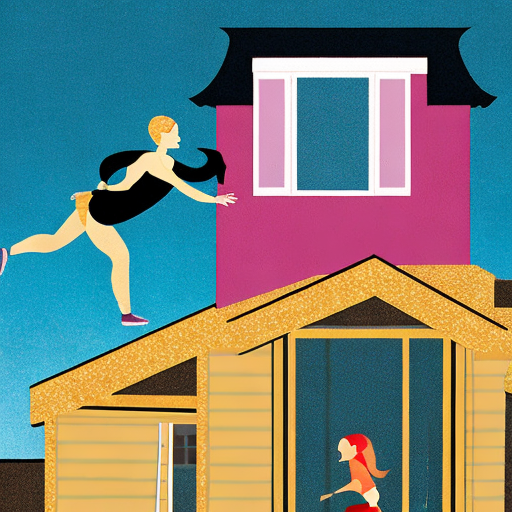
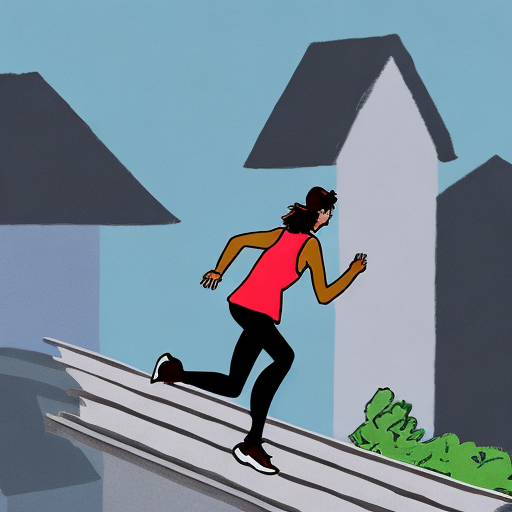

In [19]:
rh_prompt = 'A digital illustration of a woman running on the roof of a house.'
images = generate_gpu(rh_prompt, num_images=4, steps=50)

ipyplot.plot_images(images)

In [ ]:
# save the function to be reusable later on
generate_gpu.save(name='sd_generate')

In [ ]:
# By default, the GPU will terminate after 30 min of inactivity.
# To keep it up to reuse it for the rest of the tutorials
gpu.keep_warm()

# To stop the cluster after 10 min of inactivity
# gpu.keep_warm(autostop_mins=10)

# To terminate the cluster through runhouse. It can also be terminated directly through the cloud provider
# or by using the CLI commands `sky down gpu` or `sky down --all`
# gpu.teardown() 

## 02 Faster Stable Diffusion
The previous function will load the pretrained model every time the function is run. In this section, we demonstrate two ways to reuse the loaded model on the GPU to bring down the time to run Stable Diffusion.

### Load/Retrieve from Object Store

The first approach uses `rh.here.put()` and `rh.here.get()` to save down and later retrieve the model from your Runhouse object store. The model will be still need to be loaded the first run to be put in memory, so speed-ups will only be observed in future runs.

In [22]:
def sd_generate_pinned(prompt, num_images=1, steps=100, guidance_scale=7.5,
                       model_id='stabilityai/stable-diffusion-2-base',
                       revision="fp16"):
    import torch
    import runhouse as rh
    from diffusers import StableDiffusionPipeline, DDIMScheduler

    pipe = rh.here.get(model_id)

    # pin to memory if it is not in memory yet
    if pipe is None:
        pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16, revision=revision).to("cuda")
        pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
        rh.here.put(model_id, pipe)
    
    return pipe(prompt, num_images_per_prompt=num_images,
                num_inference_steps=steps, guidance_scale=guidance_scale).images

In [ ]:
generate_pinned_gpu = rh.function(fn=sd_generate_pinned).to(gpu).save("sd_generate_pinned")
my_prompt = 'A hot dog made of matcha powder.'
matcha_images = generate_pinned_gpu(my_prompt, num_images=4, steps=50)

WARNING | 2023-02-07 16:29:32,700 | /usr/local/lib/python3.8/dist-packages/ipyplot/_utils.py:95: FutureWarning: The input object of type 'Image' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Image', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  return np.asarray(seq, dtype=type(seq[0]))




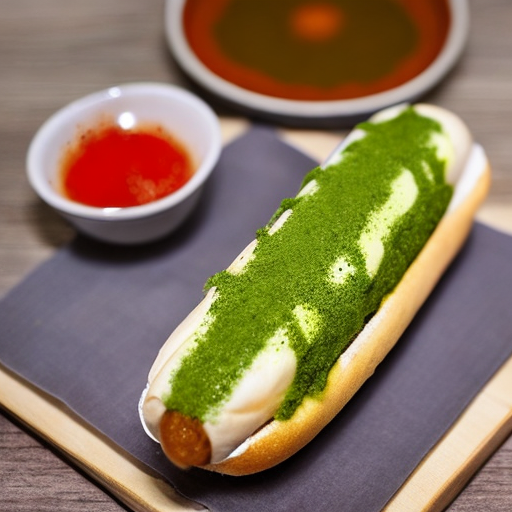
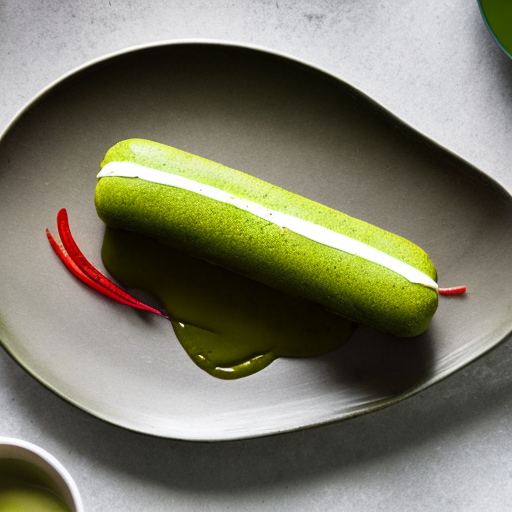
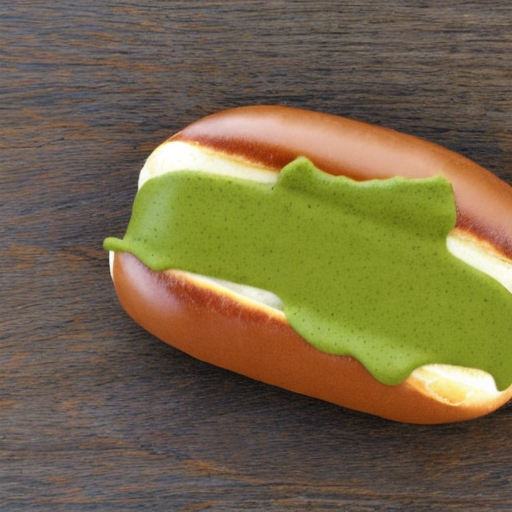
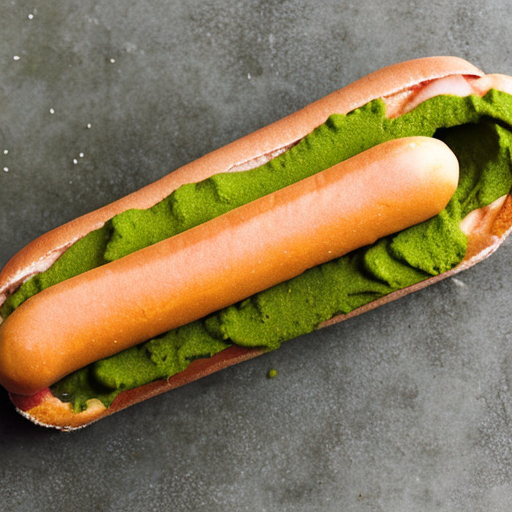


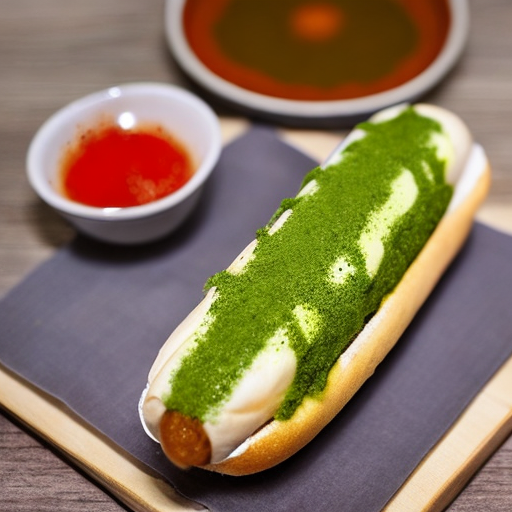
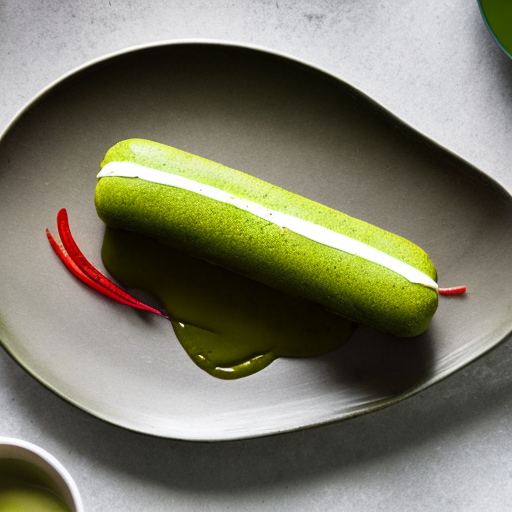
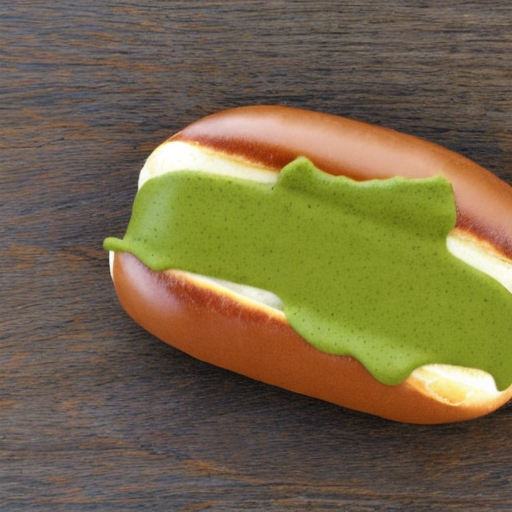
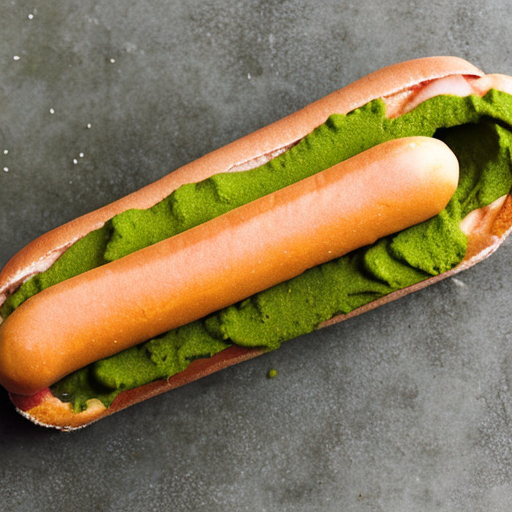

In [33]:
ipyplot.plot_images(matcha_images)

### Runhouse Module

The second approach constructs a Runhouse Module that maintains the model as a class variable. In notebook settings, we define this Module in another file and import it here.

```
# sd_model.py

import runhouse as rh
import torch
from diffusers import StableDiffusionPipeline

class SDModel(rh.Module):

    def __init__(self, model_id='stabilityai/stable-diffusion-2-base',
                       dtype=torch.float16, revision="fp16", device="cuda"):
        super().__init__()
        self.model_id, self.dtype, self.revision, self.device = model_id, dtype, revision, device

    @property
    def pipeline(self):
        if not hasattr(self, '_pipeline'):
            self._pipeline = StableDiffusionPipeline.from_pretrained(self.model_id, torch_dtype=self.dtype, revision=self.revision).to(self.device)
        return self._pipeline
    
    def predict(self, prompt, num_images=1, steps=100, guidance_scale=7.5):
        return self.pipeline(prompt, num_images_per_prompt=num_images,
                             num_inference_steps=steps, guidance_scale=guidance_scale).images
```

In [ ]:
from sd_model import SDModel

model = SDModel()
model_gpu = model.to(system=gpu)

module_images = model_gpu.predict('my_prompt', num_images=4, steps=50)

## 03 FLAN-T5 Stable Diffusion

Here, we use FLAN-T5, a text-to-text generation model, to generate prompts for us. We'll send a FLAN-T5 inference function to our GPU, and then pipe the outputs into our Stable Diffusion service.

In [27]:
def causal_lm_generate(prompt, model_id='google/flan-t5-xl', **model_kwargs):
    import runhouse as rh
    from transformers import AutoModelForSeq2SeqLM, AutoTokenizer

    (tokenizer, model) = rh.get_pinned_object(model_id) or (None, None)
    
    # pin to memory if it is not in memory yet
    if model is None:
        tokenizer = AutoTokenizer.from_pretrained(model_id)
        model = AutoModelForSeq2SeqLM.from_pretrained(model_id).to('cuda')
        rh.pin_to_memory(model_id, (tokenizer, model))
    inputs = tokenizer(prompt, return_tensors="pt").to('cuda')
    outputs = model.generate(**inputs, **model_kwargs)
    return tokenizer.batch_decode(outputs, skip_special_tokens=True)

In [28]:
flan_t5_generate = rh.function(fn=causal_lm_generate).to(gpu, env=['./'])

INFO | 2023-02-07 16:15:17,183 | Writing out function to /content/send_fn.py as functions serialized in notebooks are brittle. Please make sure the function does not rely on any local variables, including imports (which should be moved inside the function body).
WARNING | 2023-02-07 16:15:17,186 | You should name Functions that are created in notebooks to avoid naming collisions between the modules that are created to hold their functions (i.e. "send_fn.py" errors.
INFO | 2023-02-07 16:15:17,197 | Setting up Function on cluster.
INFO | 2023-02-07 16:15:17,204 | Copying local package content to cluster <rh-a10x-aws>
INFO | 2023-02-07 16:15:17,206 | Creating new ssh folder: content
INFO | 2023-02-07 16:15:17,514 | Installing packages on cluster rh-a10x-aws: ['./']
INFO | 2023-02-07 16:15:17,558 | Function setup complete.


In [29]:
my_prompt = "A detailed oil painting of"
sequences = flan_t5_generate(my_prompt, max_new_tokens=100, min_length=20, temperature=2.0, repetition_penalty=3.0,
                              use_cache=False, do_sample=True, num_beams=3, num_return_sequences=4)

full_seqs = [my_prompt + " " + seq for seq in sequences]
for seq in full_seqs:
  print(seq)

INFO | 2023-02-07 16:15:19,115 | Running causal_lm_generate via gRPC
INFO | 2023-02-07 16:19:04,544 | Time to send message: 225.42 seconds
A detailed oil painting of an ancient Greek vase in a medieval gallery with two candlesticks on and some sort of pedestal. It is signed at lower right "C.P." (probably the same signature used by the artist).
A detailed oil painting of a rose in the sun. This beautiful flower is known as an achile, which means that it can only be seen by night-time predators like crows and robins. In this painting you'll notice all sorts of details on the leaves (that are not actually green), flowers, and butterflies. It's a small but lovely detail for someone who wants to have their art work professionally done.
A detailed oil painting of horses and a cart on an idyllic country farm. Painted in 1880 by the painter, Auguste Bresson (1845-1925), for his own private collection; over time it became part of the Art Gallery of Victoria's permanent collection.
A detailed o

INFO | 2023-02-07 16:25:41,344 | Running sd_generate_pinned via gRPC
INFO | 2023-02-07 16:26:20,268 | Time to send message: 38.92 seconds
WARNING | 2023-02-07 16:26:20,280 | /usr/local/lib/python3.8/dist-packages/ipyplot/_utils.py:95: FutureWarning: The input object of type 'Image' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Image', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  return np.asarray(seq, dtype=type(seq[0]))




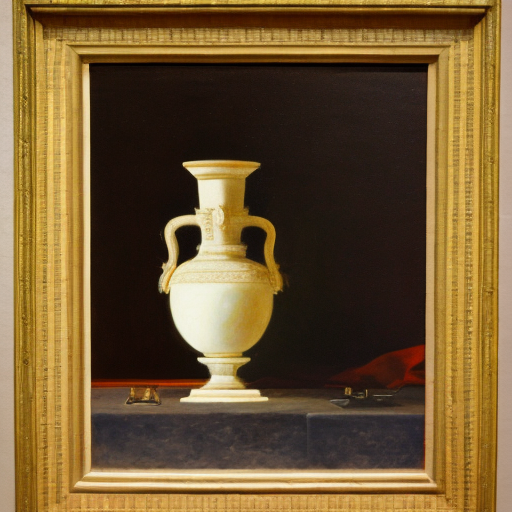
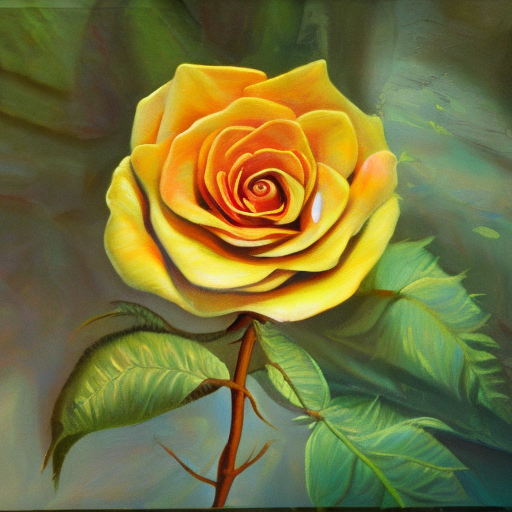
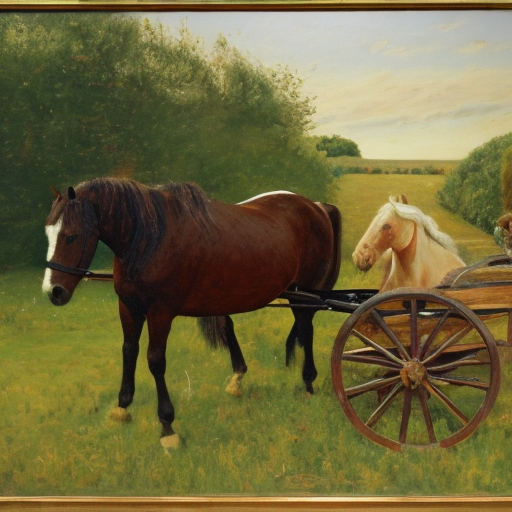
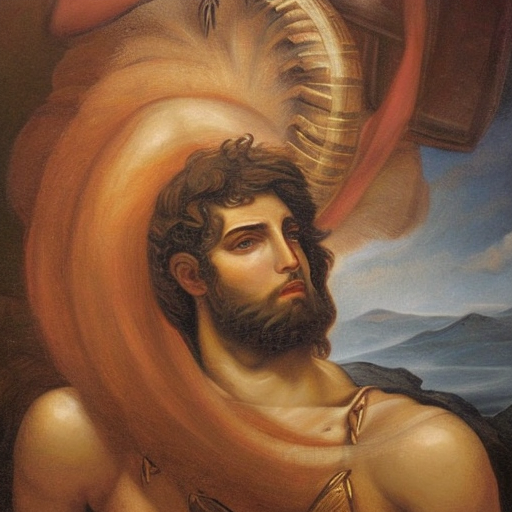


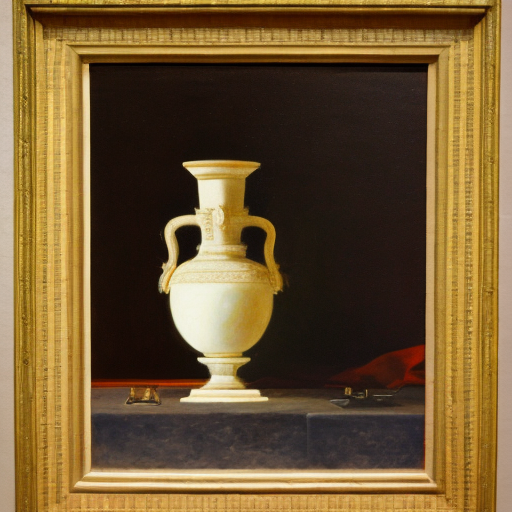
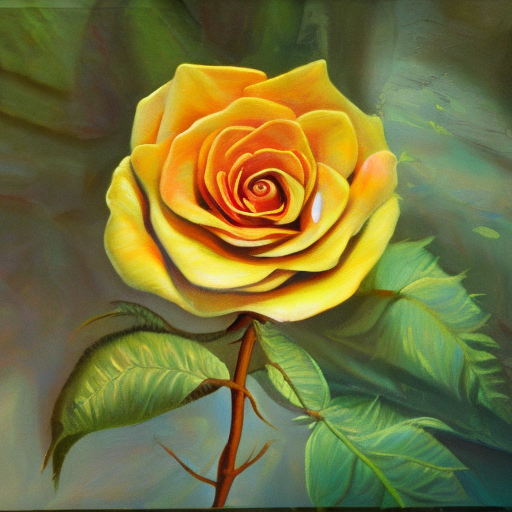
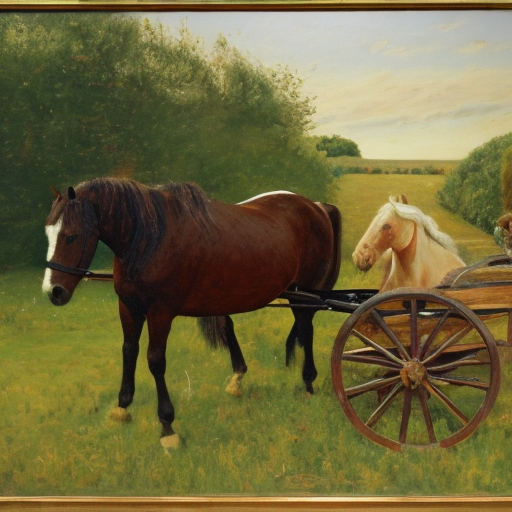
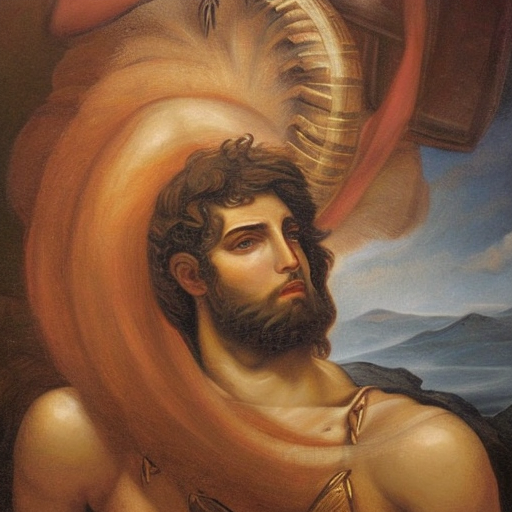

In [31]:
# We can directly access the function by the name we saved it by, even on a different environment or run
saved_sd_generate = rh.function('sd_generate_pinned')
paintings = saved_sd_generate(full_seqs, num_images=1, steps=50)

ipyplot.plot_images(paintings)